## Using GAN for Data Augmentation in Pneumonia Detection with Imbalanced Dataset

This notebook demonstrates the use of Generative Adversarial Networks (GANs) as a data augmentation technique to address the class imbalance in the Pneumonia detection dataset. Synthetic chest X-ray images for the minority class (non-pneumonia) are generated to enhance the training data, thereby improving model performance. This approach helps balance the dataset and enables the model to learn more effectively, particularly in detecting pneumonia in X-ray images where the minority class is often underrepresented.

### Suppressing Warnings in Python

In [ ]:
import warnings
warnings.filterwarnings("ignore")

### Importing Dependencies

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.models import Sequential, Model
from keras.layers import *
from keras.optimizers.legacy import Adam
from keras.utils import plot_model
from keras.models import load_model, save_model
from keras.losses import BinaryCrossentropy
import cv2
import os

### Connecting to the data source (Google Drive)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


### Loading and Labeling the data

In [ ]:
labels = ['PNEUMONIA', 'NORMAL']
img_size = 150
def get_training_data(data_dir):
    data = []
    for label in labels:
        path = os.path.join(data_dir, label)
        class_num = labels.index(label)
        for img in os.listdir(path):
            try:
                img_arr = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                resized_arr = cv2.resize(img_arr, (img_size, img_size)) # Reshaping images to preferred size
                data.append([resized_arr, class_num])
            except Exception as e:
                print(e)
    return np.array(data)

In [ ]:
train = get_training_data('/content/gdrive/MyDrive/chest_xray/train')
test = get_training_data('/content/gdrive/MyDrive/chest_xray/test')
val = get_training_data('/content/gdrive/MyDrive/chest_xray/val')

OpenCV(4.8.0) /io/opencv/modules/imgproc/src/resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'resize'

OpenCV(4.8.0) /io/opencv/modules/imgproc/src/resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'resize'

OpenCV(4.8.0) /io/opencv/modules/imgproc/src/resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'resize'

OpenCV(4.8.0) /io/opencv/modules/imgproc/src/resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



##### Total Training Images : 5241

In [ ]:
len(train)

5241

### Splitting Data into Features and Labels for Training, Testing, and Validation

In [ ]:
def generate_x_y_train_test(arr):
  x = []
  y = []
  for i in range(len(arr)):
    x.append(arr[i][0])
    y.append(arr[i][1])
  return np.array(x),np.array(y)

In [ ]:
x_train, y_train = generate_x_y_train_test(train)
x_test, y_test = generate_x_y_train_test(test)
x_val, y_val = generate_x_y_train_test(val)

### Data Distribution

##### 0 - Pneumonia, 1 - Normal

In [ ]:
pd.value_counts(y_train)

0    3900
1    1341
dtype: int64

Dataset is highly imbalanced with 'Normal' as minority class

### Normalizing Training Data to Scale Between 0 and 1

In [ ]:
x_train = x_train/255
print(x_train.min(),x_train.max())

0.0 1.0


### Defining Training Parameters for GAN Model

In [ ]:
total_epochs = 200
batch_size = 256
half_batch = 128

no_of_batches = int(x_train.shape[0]/batch_size)

noise_dim = 100

adam = Adam(lr = 2e-4, beta_1=0.5)

### Defining and Compiling the Generator Model for GAN

In [ ]:
generator = Sequential([
    Dense(units = 25*25*128, input_shape = (noise_dim,)),
    Reshape((25,25,128)),
    LeakyReLU(0.2),
    BatchNormalization(),
    Conv2DTranspose(64, kernel_size=(5,5), strides = (2,2), padding = 'same'),
    LeakyReLU(0.2),
    BatchNormalization(),
    Conv2DTranspose(1, kernel_size=(5,5), strides = (3,3), padding = 'same', activation = 'tanh'),
    LeakyReLU(0.2)
])

generator.compile(loss = 'binary_crossentorpy',optimizer = adam)

generator.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 80000)             8080000   
                                                                 
 reshape_3 (Reshape)         (None, 25, 25, 128)       0         
                                                                 
 leaky_re_lu_18 (LeakyReLU)  (None, 25, 25, 128)       0         
                                                                 
 batch_normalization_6 (Bat  (None, 25, 25, 128)       512       
 chNormalization)                                                
                                                                 
 conv2d_transpose_6 (Conv2D  (None, 50, 50, 64)        204864    
 Transpose)                                                      
                                                                 
 leaky_re_lu_19 (LeakyReLU)  (None, 50, 50, 64)       

### Defining and Compiling the Discriminator Model for GAN

In [ ]:
descriminator = Sequential([
    Conv2D(64, kernel_size=(5,5), strides=(3,3), padding='same', input_shape=(150,150,1)),
    LeakyReLU(0.2),
    Conv2D(128, kernel_size=(5,5), strides=(2,2), padding='same'),
    LeakyReLU(0.2),
    Flatten(),
    Dense(100),
    LeakyReLU(0.2),
    Dense(1, activation='sigmoid')
])

descriminator.compile(loss = 'binary_crossentropy', optimizer=adam)

descriminator.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 50, 50, 64)        1664      
                                                                 
 leaky_re_lu_21 (LeakyReLU)  (None, 50, 50, 64)        0         
                                                                 
 conv2d_7 (Conv2D)           (None, 25, 25, 128)       204928    
                                                                 
 leaky_re_lu_22 (LeakyReLU)  (None, 25, 25, 128)       0         
                                                                 
 flatten_3 (Flatten)         (None, 80000)             0         
                                                                 
 dense_10 (Dense)            (None, 100)               8000100   
                                                                 
 leaky_re_lu_23 (LeakyReLU)  (None, 100)              

### Building and Compiling the Combined GAN Model

In [ ]:
descriminator.trainable = False

gan_input = Input(shape = (noise_dim, ))
generated_img = generator(gan_input)
gan_output = descriminator(generated_img)
model = Model(gan_input, gan_output)

model.compile(loss = 'binary_crossentropy',optimizer = adam)

In [ ]:
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 100)]             0         
                                                                 
 sequential_6 (Sequential)   (None, 150, 150, 1)       8287233   
                                                                 
 sequential_7 (Sequential)   (None, 1)                 8206793   
                                                                 
Total params: 16494026 (62.92 MB)
Trainable params: 8286849 (31.61 MB)
Non-trainable params: 8207177 (31.31 MB)
_________________________________________________________________


### Reshaping Training Data for the Discriminator Model

This code reshapes the training data to have the shape (num_samples, 150, 150, 1), which is suitable for input to the discriminator model, where each image is 150x150 pixels with a single channel (grayscale).

In [ ]:
x_train = x_train.reshape(-1,150,150,1)
x_train.shape

(5241, 150, 150, 1)

### Filtering Normal Samples from the Training Data

This code filters the `x_train` and `y_train` arrays to include only the samples where the label (`y_train`) is equal to 1, representing the "normal" class. It creates separate arrays, `x_train_normal` and `y_train_normal`, that contain only the normal samples.

In [ ]:
x_train_normal = np.array([x_train[i] for i in range(len(x_train)) if y_train[i]==1])
y_train_normal = np.array([y_train[i] for i in range(len(y_train)) if y_train[i]==1])

In [ ]:
x_train_normal.shape

(1341, 150, 150, 1)

### Function to Display Generated Images from the Generator

This function generates a set of images using the GAN's generator by feeding random noise into it, reshaping the output to match the image dimensions (150x150), and displaying them in a 5x5 grid using `matplotlib`. The images are shown in grayscale.

In [ ]:
def display_images(samples = 25):
  noise = np.random.normal(0,1,size = (samples,noise_dim))
  generated_img = generator.predict(noise)
  plt.figure(figsize=(10,10))
  for i in range(samples):
    plt.subplot(5,5,i+1)
    plt.imshow(generated_img[i].reshape(150,150), cmap='gray')
    plt.axis('off')

  plt.show()

### GAN Training Loop for Discriminator and Generator

Following code defines the training loop for the GAN, where the discriminator and generator are trained alternately:

- **Discriminator Training:**  
  The discriminator is trained on both real and fake images in mini-batches. It is first trained on real images with labels of `1` (real), then on generated (fake) images with labels of `0` (fake). The average loss is computed from both real and fake image batches.

- **Generator Training:**  
  The generator is trained to produce fake images that the discriminator classifies as real. It is trained using a frozen discriminator to ensure that only the generator's weights are updated during this step.

- **Loss Calculation:**  
  The losses for both the discriminator (`d_loss`) and the generator (`g_loss`) are calculated and averaged over the number of batches in the epoch.

- **Model Saving & Image Display:**  
  Every 10 epochs, the generator model is saved to a file (`generator.h5`), and a set of generated images is displayed using the `display_images` function.

This loop continues for the specified number of epochs (`total_epochs`, 200 in this case) . The losses for both the discriminator and the generator are tracked throughout the training.

Epoch 1, Disc loss 0.2755881087097805, Generator loss 2.215458814799786
Epoch 2, Disc loss 0.1681251303787576, Generator loss 1.3529086872935294
Epoch 3, Disc loss 0.1647683421309921, Generator loss 0.7219558730721474
Epoch 4, Disc loss 0.16482156436759396, Generator loss 0.26128666996955874
Epoch 5, Disc loss 0.1632482829860237, Generator loss 0.10066559053957462
Epoch 6, Disc loss 0.16405597962284446, Generator loss 0.07075378522276879
Epoch 7, Disc loss 0.1632404279737784, Generator loss 0.046691976487636566
Epoch 8, Disc loss 0.16350177050453568, Generator loss 0.034327117074280974
Epoch 9, Disc loss 0.16321901614519446, Generator loss 0.02807836653664708
Epoch 10, Disc loss 0.16305281451673181, Generator loss 0.025347825791686773
1/1 [==============================] - 0s 96ms/step


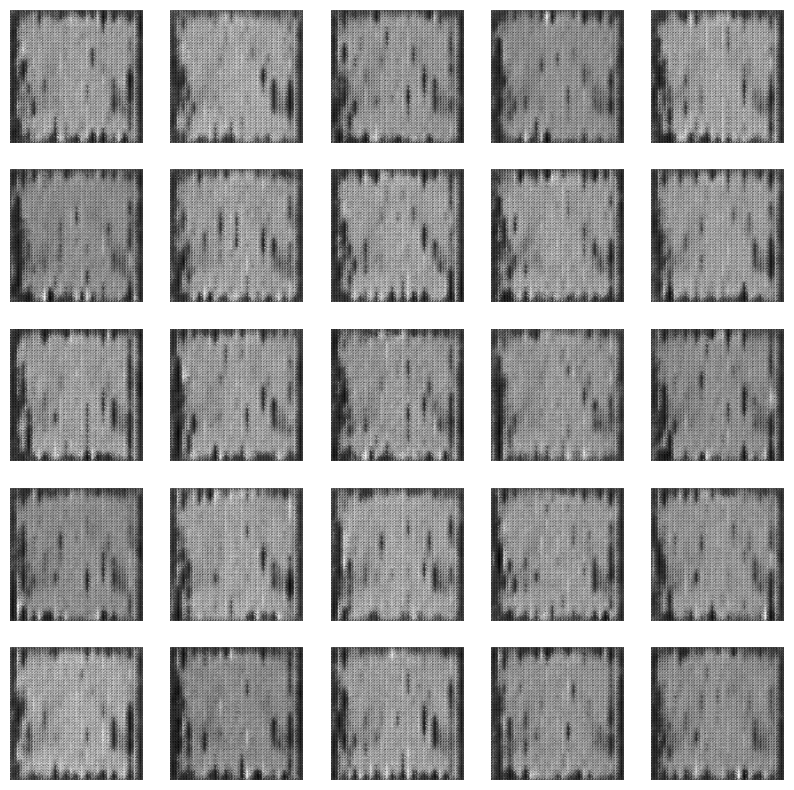

Epoch 11, Disc loss 0.16347079897213918, Generator loss 0.022053078887984155
Epoch 12, Disc loss 0.16289471230742264, Generator loss 0.01768482755869627
Epoch 13, Disc loss 0.1630772733694698, Generator loss 0.015463425358757377
Epoch 14, Disc loss 0.1638134133015967, Generator loss 0.015158354071900249
Epoch 15, Disc loss 0.39008503543549294, Generator loss 1.5521149860927834
Epoch 16, Disc loss 0.16620209776119738, Generator loss 0.06215387564152479
Epoch 17, Disc loss 0.1650613464462367, Generator loss 0.018701180024072526
Epoch 18, Disc loss 0.165005205754278, Generator loss 0.027401947323232888
Epoch 19, Disc loss 0.9769577449675125, Generator loss 9.722658695559948
Epoch 20, Disc loss 0.2385727510380093, Generator loss 11.111017739772796
1/1 [==============================] - 0s 18ms/step


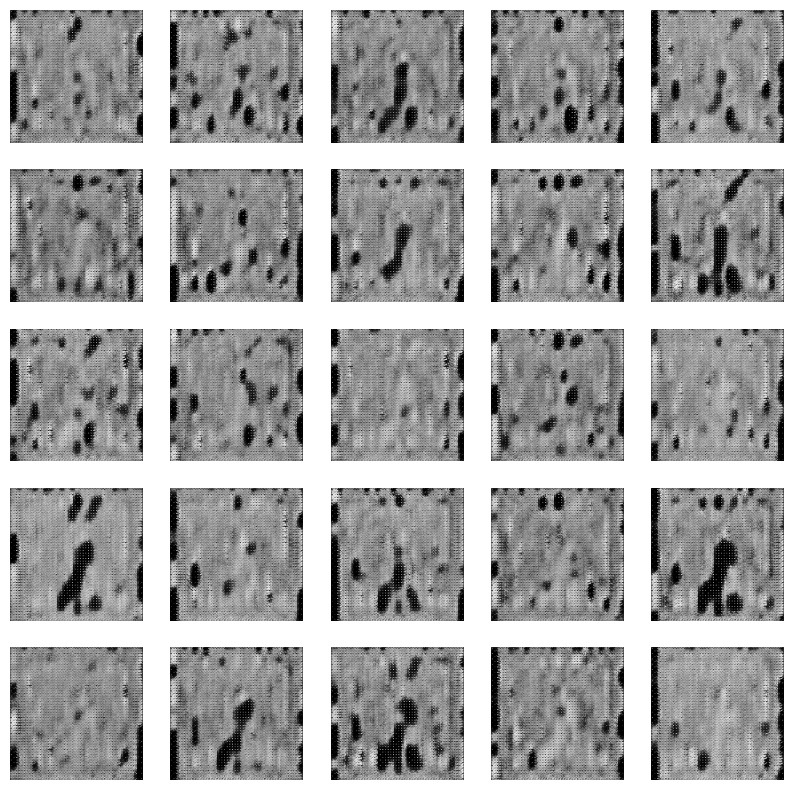

Epoch 21, Disc loss 0.3030358356423676, Generator loss 7.69287600517273
Epoch 22, Disc loss 0.2188261321745813, Generator loss 5.653714323043824
Epoch 23, Disc loss 0.200363617669791, Generator loss 5.401843929290772
Epoch 24, Disc loss 0.20584770743735134, Generator loss 5.405518412590027
Epoch 25, Disc loss 0.20507286549545825, Generator loss 5.298125815391541
Epoch 26, Disc loss 0.21790759870782495, Generator loss 5.6536112308502195
Epoch 27, Disc loss 0.2217079024296254, Generator loss 5.380670046806335
Epoch 28, Disc loss 0.2279786397702992, Generator loss 5.283340239524842
Epoch 29, Disc loss 0.24928690530359746, Generator loss 4.620661652088165
Epoch 30, Disc loss 0.2673906250856817, Generator loss 4.254459810256958
1/1 [==============================] - 0s 18ms/step


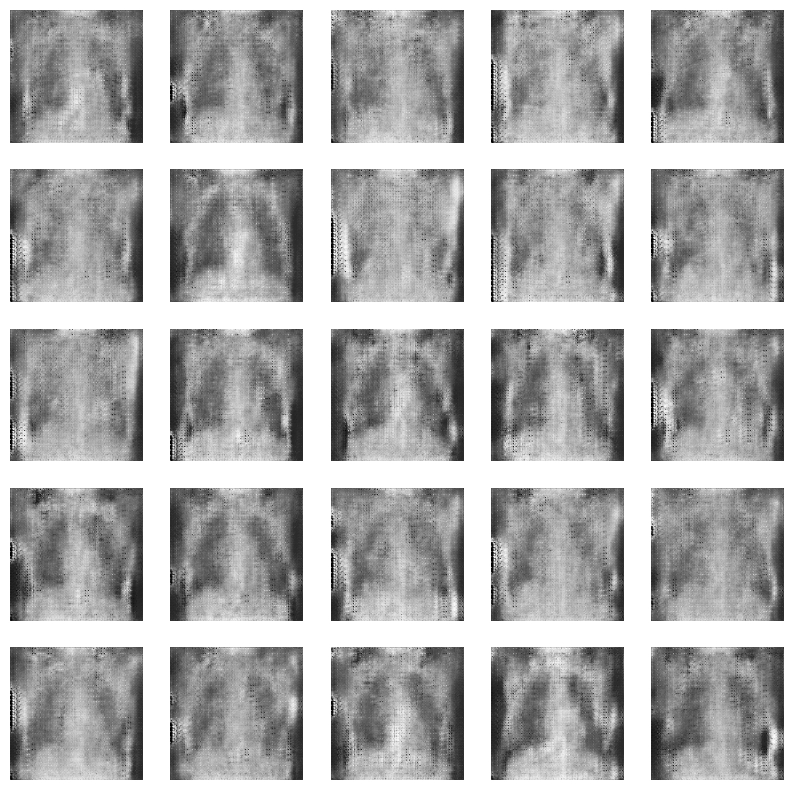

Epoch 31, Disc loss 0.2438564465381205, Generator loss 3.338286596536636
Epoch 32, Disc loss 0.27082842756062747, Generator loss 3.2234166622161866
Epoch 33, Disc loss 0.2990053410641849, Generator loss 2.965188205242157
Epoch 34, Disc loss 0.319653723295778, Generator loss 2.5273144841194153
Epoch 35, Disc loss 0.3577121302485466, Generator loss 2.599271905422211
Epoch 36, Disc loss 0.36253368891775606, Generator loss 2.7274027347564695
Epoch 37, Disc loss 0.37826561331748965, Generator loss 3.1623869955539705
Epoch 38, Disc loss 0.40209584701806306, Generator loss 3.096614623069763
Epoch 39, Disc loss 0.4038202650845051, Generator loss 3.2497116804122923
Epoch 40, Disc loss 0.38955323910340667, Generator loss 3.449924051761627
1/1 [==============================] - 0s 18ms/step


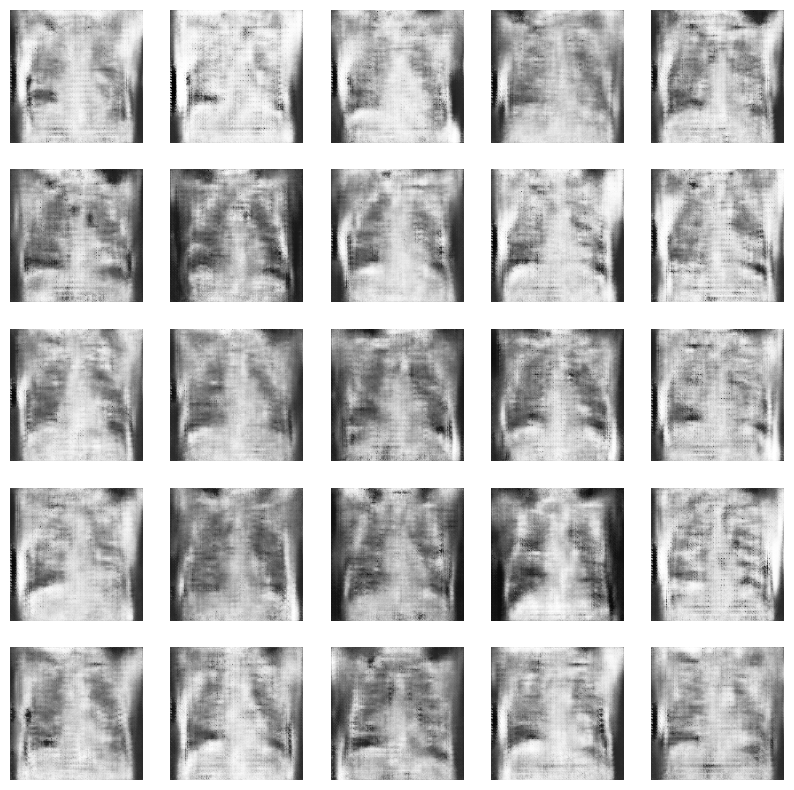

Epoch 41, Disc loss 0.40981583259999754, Generator loss 3.1313077211380005
Epoch 42, Disc loss 0.4148928951472044, Generator loss 3.3332526803016664
Epoch 43, Disc loss 0.4025097154080868, Generator loss 3.2326246738433837
Epoch 44, Disc loss 0.3960737864486873, Generator loss 3.5506263732910157
Epoch 45, Disc loss 0.40133155807852744, Generator loss 3.1112284779548647
Epoch 46, Disc loss 0.4074867695569992, Generator loss 2.941522753238678
Epoch 47, Disc loss 0.4112593673169613, Generator loss 2.9993515372276307
Epoch 48, Disc loss 0.41183307617902754, Generator loss 2.721351408958435
Epoch 49, Disc loss 0.481594954803586, Generator loss 2.458682096004486
Epoch 50, Disc loss 0.48718583807349203, Generator loss 2.3934853255748747
1/1 [==============================] - 0s 21ms/step


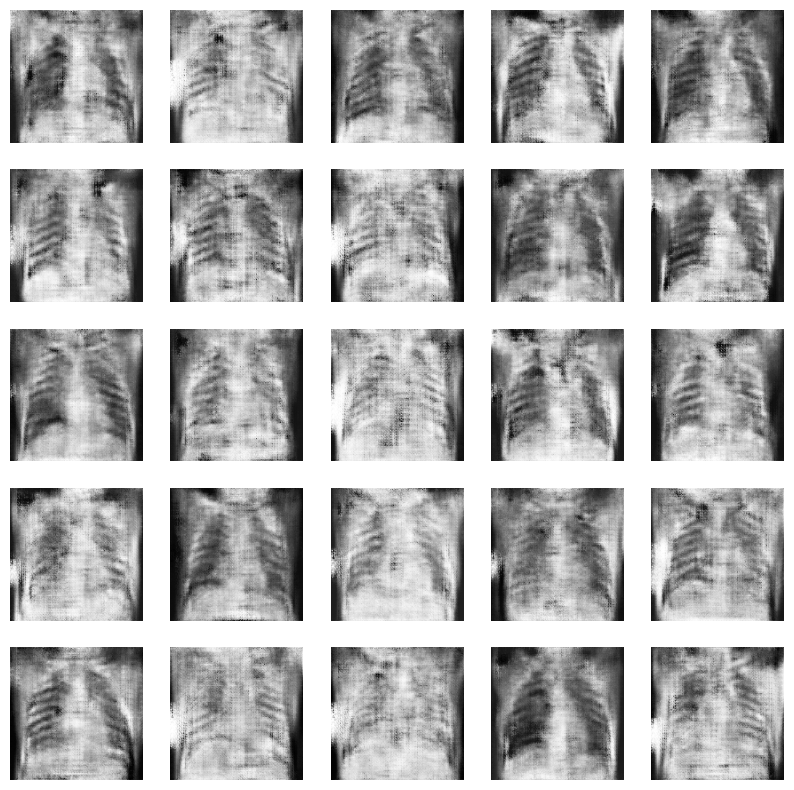

Epoch 51, Disc loss 0.49530605897307395, Generator loss 2.4396336674690247
Epoch 52, Disc loss 0.446791934594512, Generator loss 2.603083050251007
Epoch 53, Disc loss 0.472315938025713, Generator loss 2.6549503803253174
Epoch 54, Disc loss 0.448810575902462, Generator loss 2.5948393821716307
Epoch 55, Disc loss 0.45000253096222875, Generator loss 2.655675399303436
Epoch 56, Disc loss 0.4296938620507717, Generator loss 2.9447842836380005
Epoch 57, Disc loss 0.4095139980316162, Generator loss 2.816831278800964
Epoch 58, Disc loss 0.46384965293109415, Generator loss 2.560530352592468
Epoch 59, Disc loss 0.4395135935395956, Generator loss 2.6274300694465635
Epoch 60, Disc loss 0.4371895842254162, Generator loss 2.6232244253158568
1/1 [==============================] - 0s 24ms/step


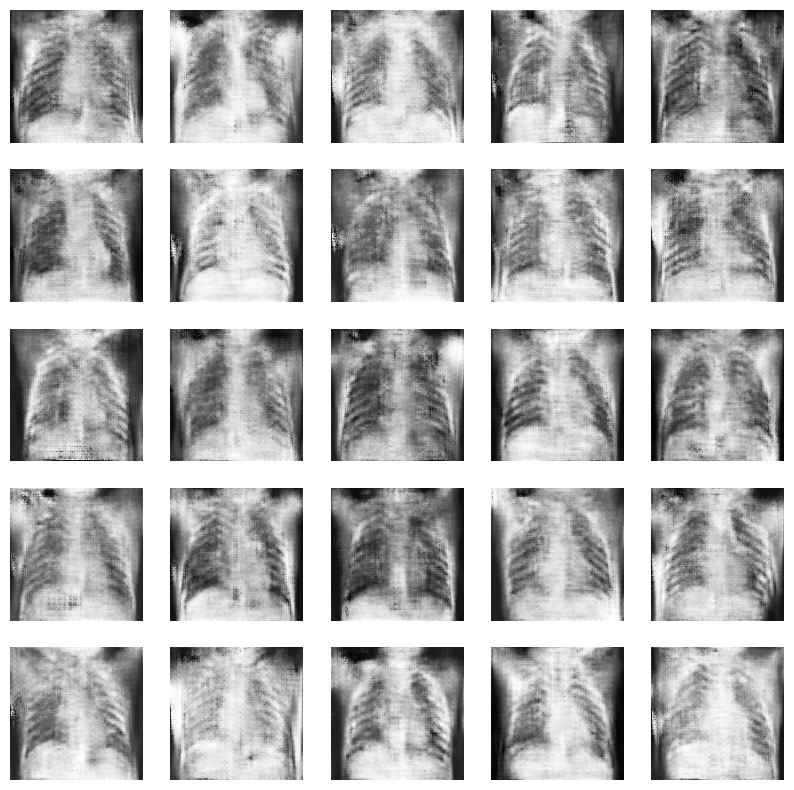

Epoch 61, Disc loss 0.5057382185012103, Generator loss 2.638020658493042
Epoch 62, Disc loss 0.439673837646842, Generator loss 2.7824107885360716
Epoch 63, Disc loss 0.4150903433561325, Generator loss 2.791258382797241
Epoch 64, Disc loss 0.448544579744339, Generator loss 2.663415825366974
Epoch 65, Disc loss 0.40302236322313545, Generator loss 2.818204391002655
Epoch 66, Disc loss 0.38954420741647483, Generator loss 2.8709181785583495
Epoch 67, Disc loss 0.4047177527099848, Generator loss 2.812466585636139
Epoch 68, Disc loss 0.3686140803620219, Generator loss 3.225278890132904
Epoch 69, Disc loss 0.36844023000448944, Generator loss 2.957528328895569
Epoch 70, Disc loss 0.3832878306508064, Generator loss 2.8396725416183473
1/1 [==============================] - 0s 28ms/step


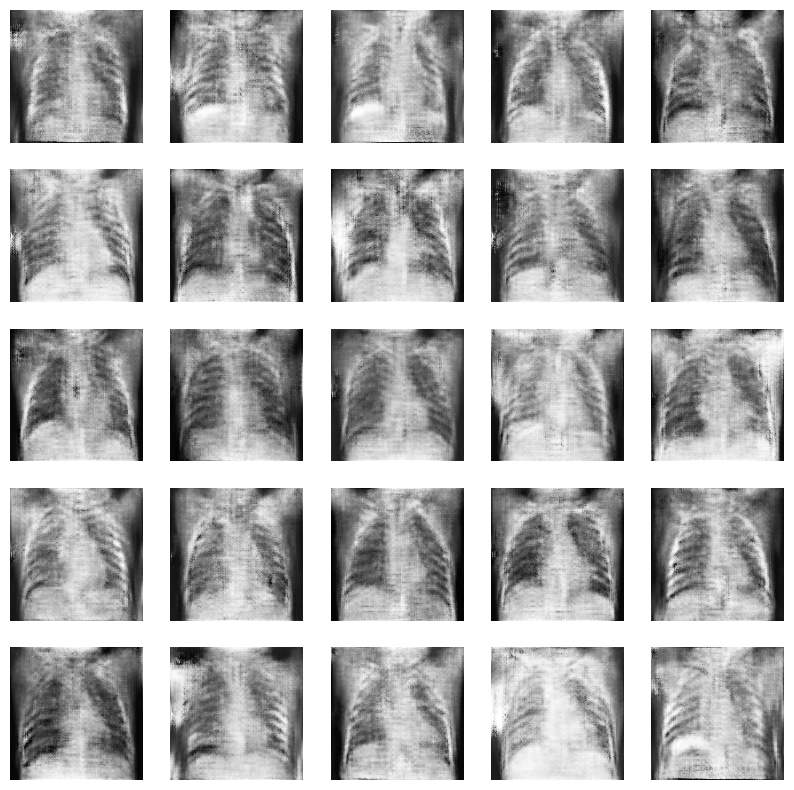

Epoch 71, Disc loss 0.38684146795421837, Generator loss 2.9041969895362856
Epoch 72, Disc loss 0.38856163527816534, Generator loss 3.007457804679871
Epoch 73, Disc loss 0.3993407104164362, Generator loss 2.9871535539627074
Epoch 74, Disc loss 0.39103735946118834, Generator loss 3.0552714228630067
Epoch 75, Disc loss 0.35843334030359986, Generator loss 3.1043584823608397
Epoch 76, Disc loss 0.3873453751206398, Generator loss 2.950770902633667
Epoch 77, Disc loss 0.32991833724081515, Generator loss 3.2780685663223266
Epoch 78, Disc loss 0.3456553967669606, Generator loss 3.0604525923728945
Epoch 79, Disc loss 0.34994330126792195, Generator loss 3.2625767469406126
Epoch 80, Disc loss 0.3731106825172901, Generator loss 3.197559142112732
1/1 [==============================] - 0s 35ms/step


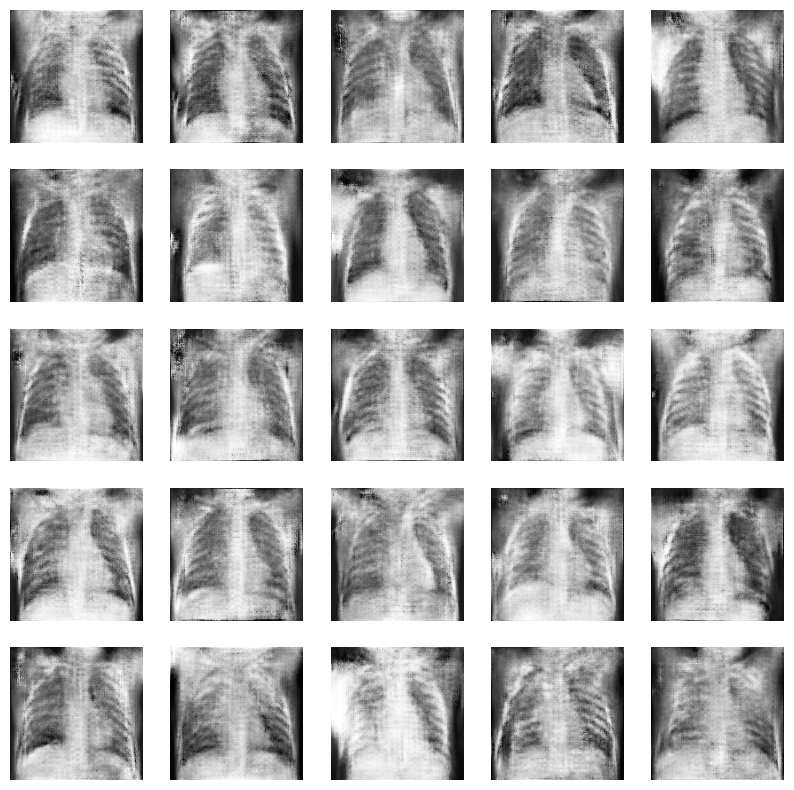

Epoch 81, Disc loss 0.36818580217659475, Generator loss 3.1886229157447814
Epoch 82, Disc loss 0.3358734334819019, Generator loss 3.2914976596832277
Epoch 83, Disc loss 0.36468259133398534, Generator loss 3.207422614097595
Epoch 84, Disc loss 0.34708877922967074, Generator loss 3.5790921330451964
Epoch 85, Disc loss 0.3404787816107273, Generator loss 3.4971554279327393
Epoch 86, Disc loss 0.3488611148670316, Generator loss 3.3849825859069824
Epoch 87, Disc loss 0.3209054072853178, Generator loss 3.4800763964653014
Epoch 88, Disc loss 0.3300214285030961, Generator loss 3.5646254301071165
Epoch 89, Disc loss 0.32528830841183665, Generator loss 3.5217121720314024
Epoch 90, Disc loss 0.3467183081433177, Generator loss 3.4216470599174498
1/1 [==============================] - 0s 29ms/step


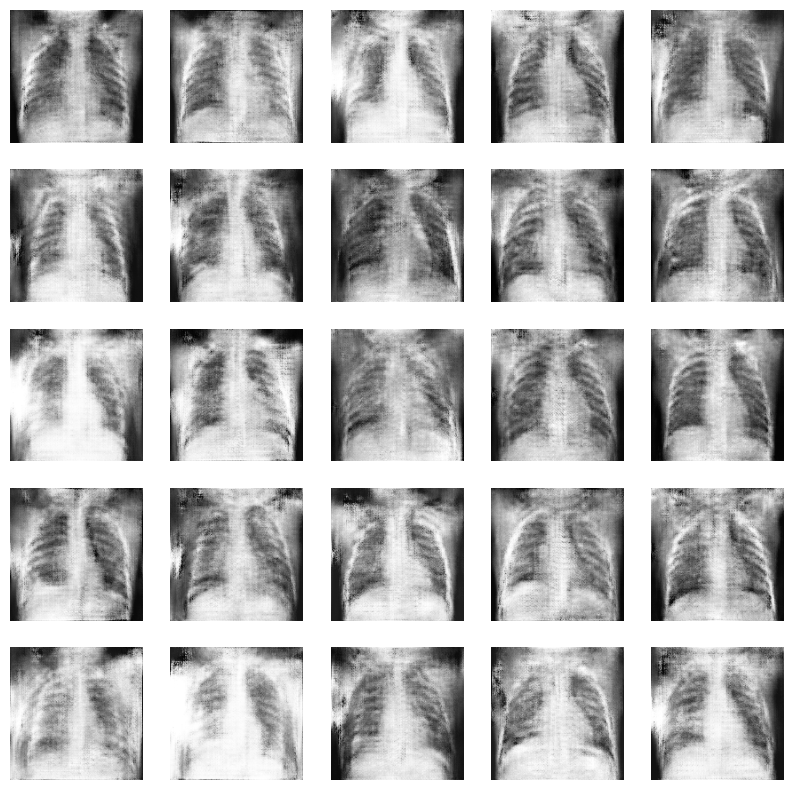

Epoch 91, Disc loss 0.33217786280438305, Generator loss 3.6335076689720154
Epoch 92, Disc loss 0.32210463769733905, Generator loss 3.528675949573517
Epoch 93, Disc loss 0.32543942872434856, Generator loss 3.6422000527381897
Epoch 94, Disc loss 0.33770091282203796, Generator loss 3.663257336616516
Epoch 95, Disc loss 0.33071066383272407, Generator loss 3.706598937511444
Epoch 96, Disc loss 0.3324274999089539, Generator loss 3.7844657421112062
Epoch 97, Disc loss 0.3104013282805681, Generator loss 3.7676753759384156
Epoch 98, Disc loss 0.3131545609794557, Generator loss 3.847869837284088
Epoch 99, Disc loss 0.2991329347714782, Generator loss 3.6934113025665285
Epoch 100, Disc loss 0.3428012927994132, Generator loss 4.425327503681183
1/1 [==============================] - 0s 31ms/step


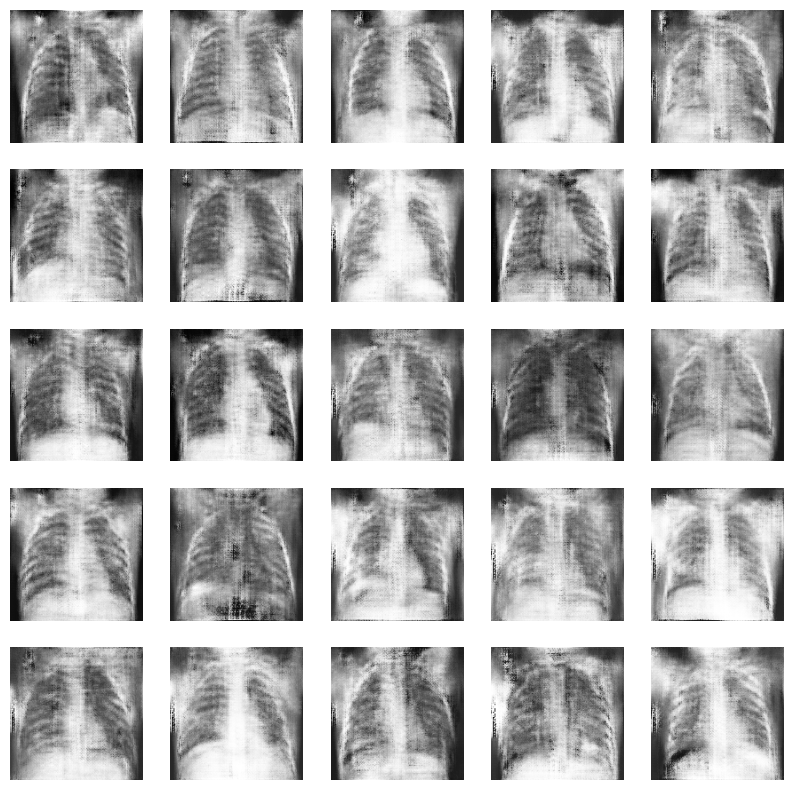

Epoch 101, Disc loss 0.3476109404116869, Generator loss 4.262749409675598
Epoch 102, Disc loss 0.3226019687950611, Generator loss 4.2824853420257565
Epoch 103, Disc loss 0.33271140791475773, Generator loss 3.8445440411567686
Epoch 104, Disc loss 0.9340905420482158, Generator loss 4.140727001428604
Epoch 105, Disc loss 0.6517774365842343, Generator loss 2.0434230744838713
Epoch 106, Disc loss 0.5232128635048866, Generator loss 1.5700358211994172
Epoch 107, Disc loss 0.4852112218737602, Generator loss 1.4901846587657928
Epoch 108, Disc loss 0.5179639831185341, Generator loss 1.449040061235428
Epoch 109, Disc loss 0.5599159523844719, Generator loss 1.5003607869148254
Epoch 110, Disc loss 0.5369398958981038, Generator loss 1.861070269346237
1/1 [==============================] - 0s 18ms/step


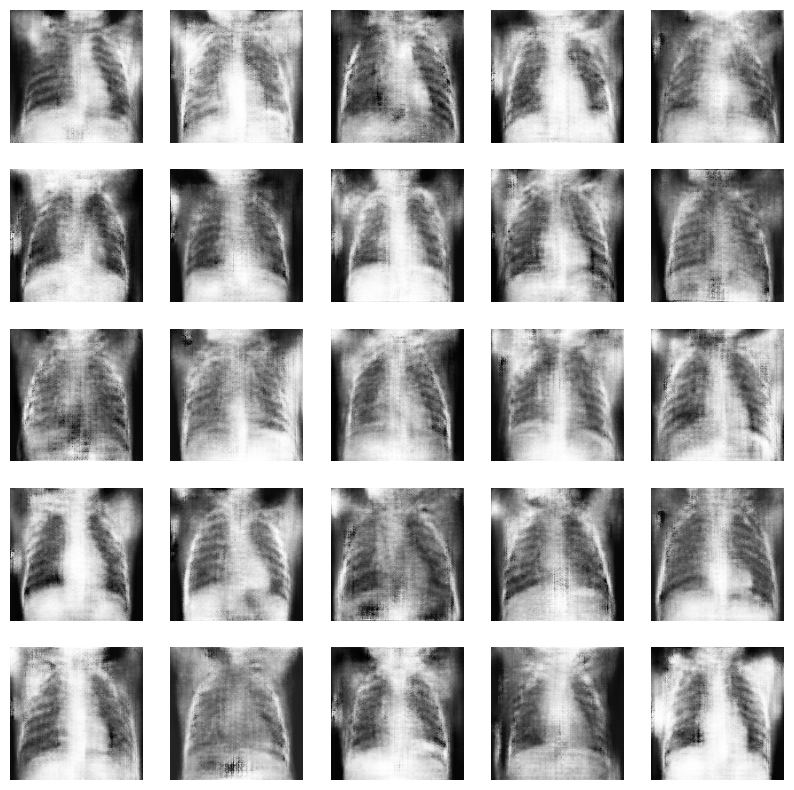

Epoch 111, Disc loss 0.5358279019594192, Generator loss 1.7189472675323487
Epoch 112, Disc loss 0.5375464119017124, Generator loss 1.8620073974132538
Epoch 113, Disc loss 0.47768931910395623, Generator loss 2.4816934287548067
Epoch 114, Disc loss 0.42505137622356415, Generator loss 2.8421043872833254
Epoch 115, Disc loss 0.45000867955386636, Generator loss 2.8466848731040955
Epoch 116, Disc loss 0.30757299475371835, Generator loss 3.773238945007324
Epoch 117, Disc loss 0.2910109324380755, Generator loss 3.6366347432136537
Epoch 118, Disc loss 0.2990538887679577, Generator loss 3.7960020184516905
Epoch 119, Disc loss 0.31220175428316, Generator loss 3.6011622071266176
Epoch 120, Disc loss 0.32610398456454276, Generator loss 3.419477164745331
1/1 [==============================] - 0s 19ms/step


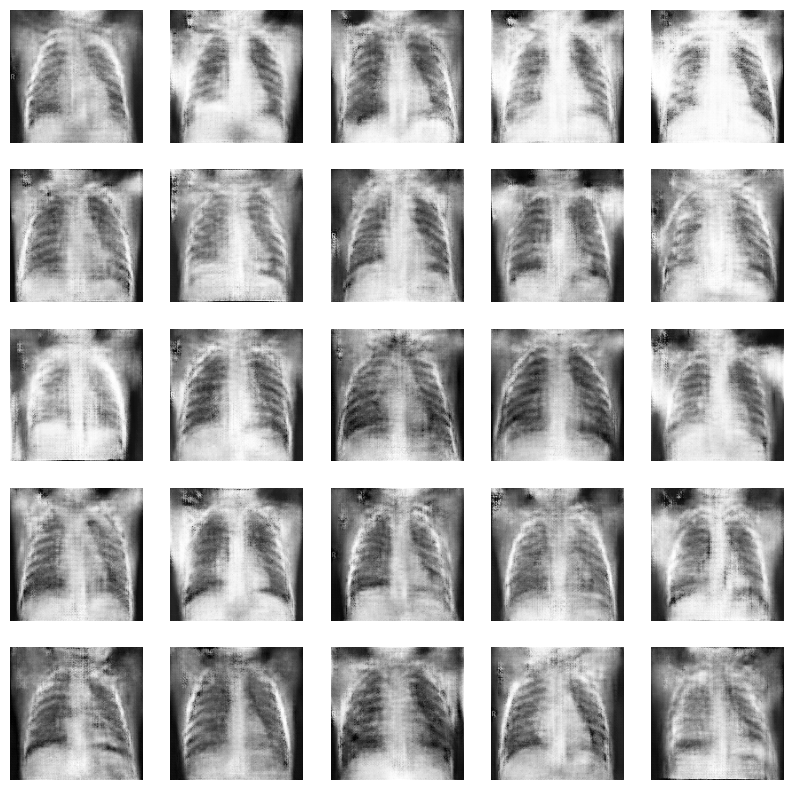

Epoch 121, Disc loss 0.31954508293420075, Generator loss 3.4777570486068727
Epoch 122, Disc loss 0.2625329547561705, Generator loss 3.7467930793762205
Epoch 123, Disc loss 0.2657481591682881, Generator loss 3.828720414638519
Epoch 124, Disc loss 0.25517541728913784, Generator loss 4.026998114585877
Epoch 125, Disc loss 0.25444065406918526, Generator loss 4.14623908996582
Epoch 126, Disc loss 0.26323479861021043, Generator loss 3.210732102394104
Epoch 127, Disc loss 0.2527288418263197, Generator loss 2.2410888850688933
Epoch 128, Disc loss 0.2699145834892988, Generator loss 2.6888465344905854
Epoch 129, Disc loss 0.3131265447475016, Generator loss 3.1960980772972105
Epoch 130, Disc loss 0.3396631650626659, Generator loss 3.4668588757514955
1/1 [==============================] - 0s 18ms/step


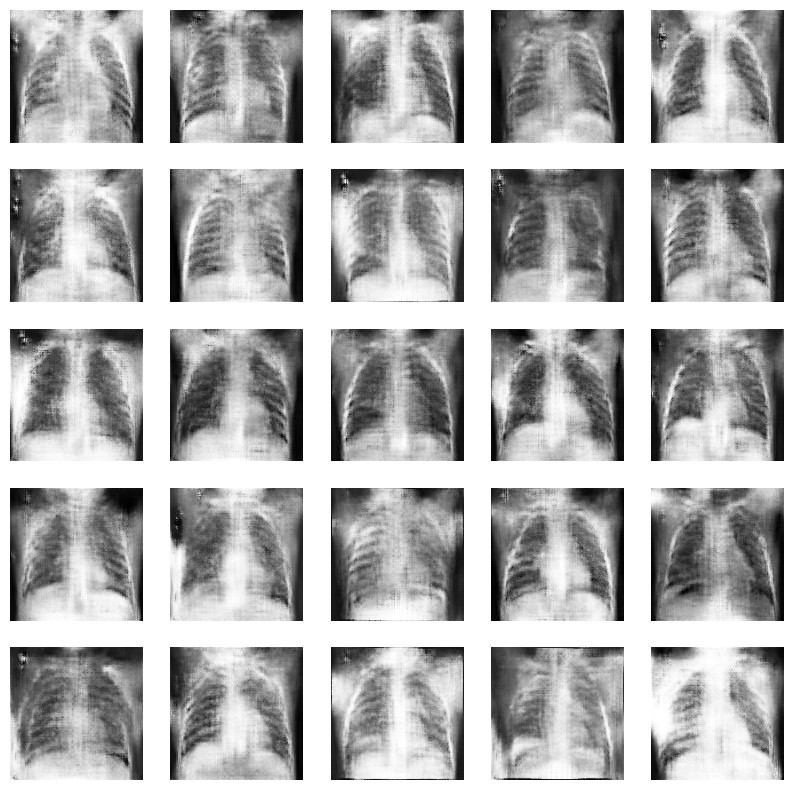

Epoch 131, Disc loss 0.32462480100803076, Generator loss 3.8431944847106934
Epoch 132, Disc loss 0.3468423271551728, Generator loss 3.55474933385849
Epoch 133, Disc loss 0.3479942758567631, Generator loss 4.042262840270996
Epoch 134, Disc loss 0.37955567007884383, Generator loss 3.704808735847473
Epoch 135, Disc loss 0.3045328031294048, Generator loss 3.942353630065918
Epoch 136, Disc loss 0.30498569188639524, Generator loss 4.021508359909058
Epoch 137, Disc loss 0.31436972673982383, Generator loss 4.088001143932343
Epoch 138, Disc loss 0.3070580240339041, Generator loss 4.105356216430664
Epoch 139, Disc loss 0.26650432366877796, Generator loss 3.9656476020812987
Epoch 140, Disc loss 0.2511519564781338, Generator loss 4.145257306098938
1/1 [==============================] - 0s 18ms/step


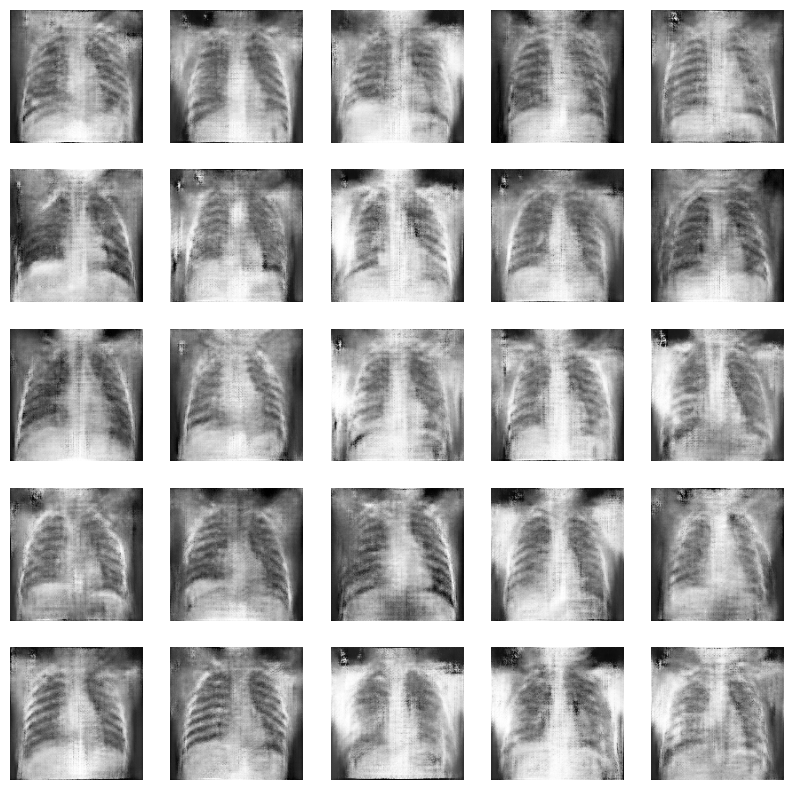

Epoch 141, Disc loss 0.25824852054938674, Generator loss 4.308876025676727
Epoch 142, Disc loss 0.2618605388328433, Generator loss 4.113515567779541
Epoch 143, Disc loss 0.2632486697752029, Generator loss 3.4743213057518005
Epoch 144, Disc loss 0.26238068789243696, Generator loss 2.9364374399185182
Epoch 145, Disc loss 0.2988064406905323, Generator loss 3.346524178981781
Epoch 146, Disc loss 0.27301405570469794, Generator loss 3.9903940320014955
Epoch 147, Disc loss 0.30954494401812555, Generator loss 3.9724146842956545
Epoch 148, Disc loss 0.2994199617300183, Generator loss 4.154782843589783
Epoch 149, Disc loss 0.33775801146402956, Generator loss 4.036755359172821
Epoch 150, Disc loss 0.3101732396055013, Generator loss 4.183718264102936
1/1 [==============================] - 0s 18ms/step


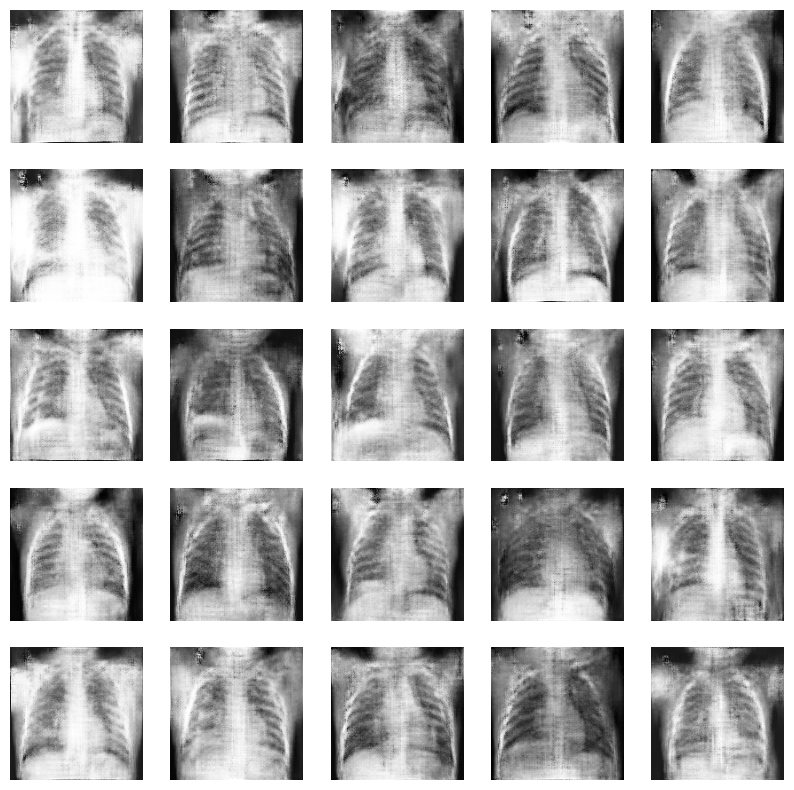

Epoch 151, Disc loss 0.33698920542374255, Generator loss 4.147246515750885
Epoch 152, Disc loss 0.340492878947407, Generator loss 4.173840272426605
Epoch 153, Disc loss 0.3636700767092407, Generator loss 4.106360995769501
Epoch 154, Disc loss 0.32949561821296813, Generator loss 4.183685255050659
Epoch 155, Disc loss 0.3388484404888004, Generator loss 4.273396575450898
Epoch 156, Disc loss 0.3165475377812982, Generator loss 4.059016859531402
Epoch 157, Disc loss 0.2895683227106929, Generator loss 4.326869738101959
Epoch 158, Disc loss 0.2872145792469382, Generator loss 3.967750298976898
Epoch 159, Disc loss 0.2844383707270026, Generator loss 4.0909867763519285
Epoch 160, Disc loss 0.30765985772013665, Generator loss 4.05523943901062
1/1 [==============================] - 0s 18ms/step


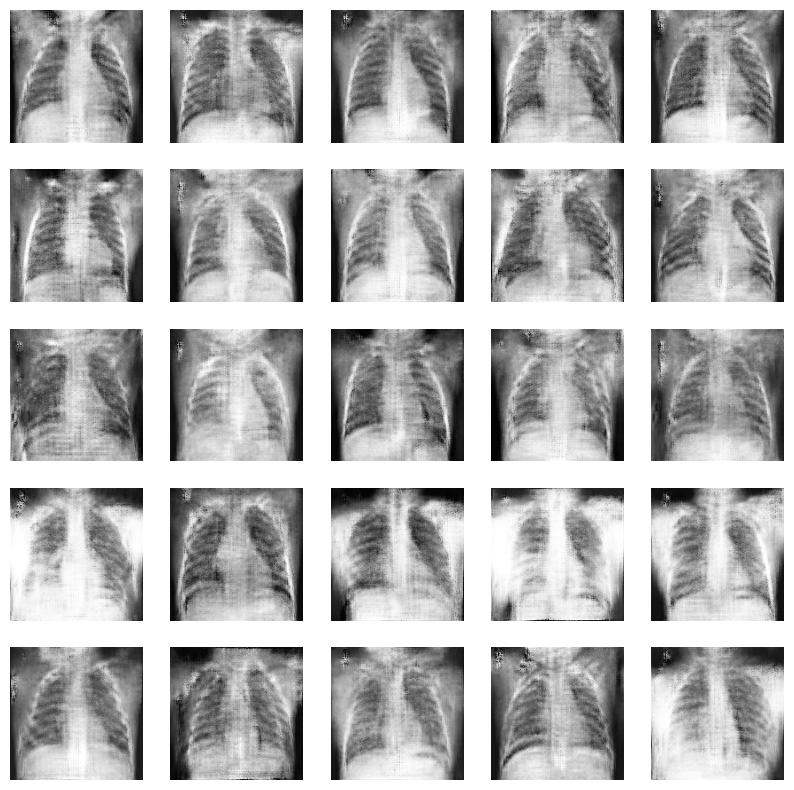

Epoch 161, Disc loss 0.3214729909785092, Generator loss 4.250187766551972
Epoch 162, Disc loss 0.3093259401619434, Generator loss 4.197438097000122
Epoch 163, Disc loss 0.26418794980272653, Generator loss 4.422520458698273
Epoch 164, Disc loss 0.9985294576734305, Generator loss 3.904244935512543
Epoch 165, Disc loss 0.46658130288124083, Generator loss 1.6637929916381835
Epoch 166, Disc loss 0.500073753297329, Generator loss 1.9344671368598938
Epoch 167, Disc loss 0.49419816881418227, Generator loss 2.240926080942154
Epoch 168, Disc loss 0.5071553304791451, Generator loss 2.365841865539551
Epoch 169, Disc loss 0.46964172795414927, Generator loss 2.447683662176132
Epoch 170, Disc loss 0.4265942953526974, Generator loss 2.7305829763412475
1/1 [==============================] - 0s 17ms/step


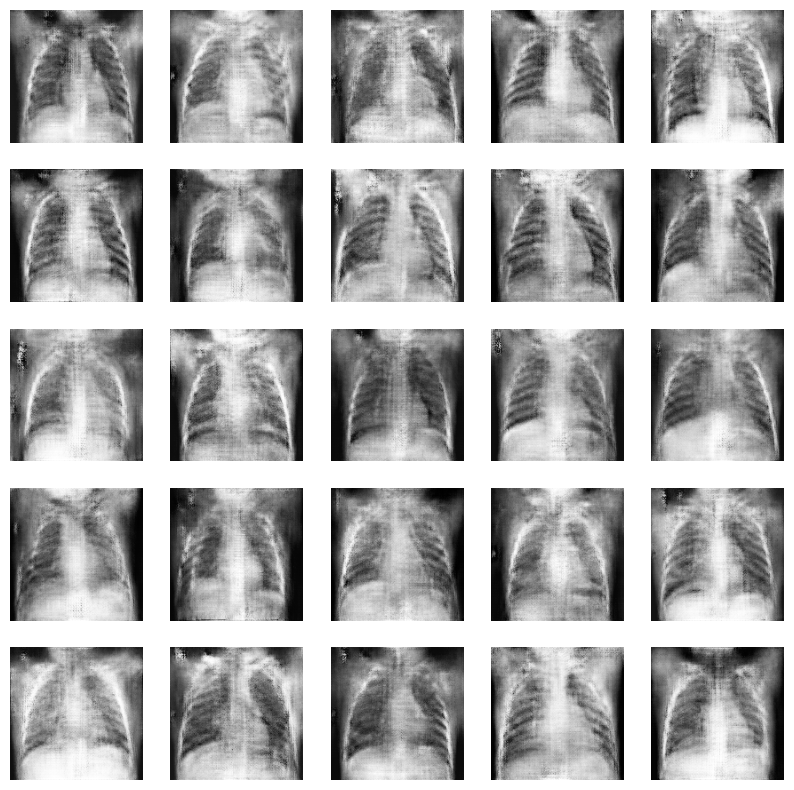

Epoch 171, Disc loss 0.3974104844033718, Generator loss 3.2640716671943664
Epoch 172, Disc loss 0.36766539737582205, Generator loss 3.325826096534729
Epoch 173, Disc loss 0.34644609559327366, Generator loss 3.7071466565132143
Epoch 174, Disc loss 0.3227870659902692, Generator loss 3.6662741899490356
Epoch 175, Disc loss 0.34487562170252206, Generator loss 3.497789371013641
Epoch 176, Disc loss 0.2853613479062915, Generator loss 3.8091226696968077
Epoch 177, Disc loss 0.3215212194249034, Generator loss 3.8142252445220945
Epoch 178, Disc loss 0.3119220333173871, Generator loss 3.737251305580139
Epoch 179, Disc loss 0.29614119343459605, Generator loss 3.9582003712654115
Epoch 180, Disc loss 0.26550159864127637, Generator loss 3.677118110656738
1/1 [==============================] - 0s 32ms/step


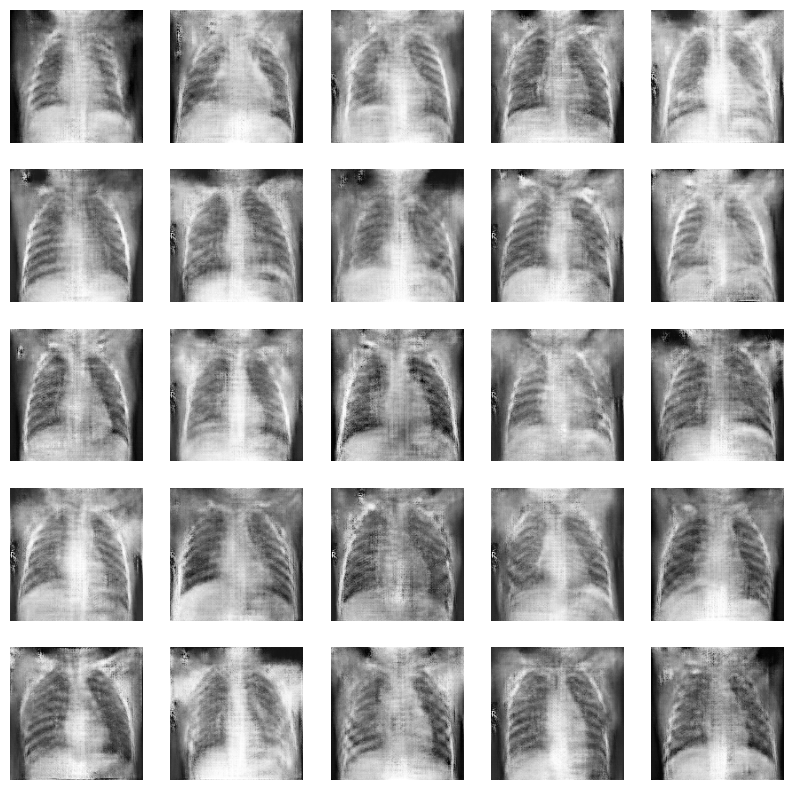

Epoch 181, Disc loss 0.25722442837432025, Generator loss 3.7737922430038453
Epoch 182, Disc loss 0.25370534136891365, Generator loss 3.972312605381012
Epoch 183, Disc loss 0.25397553090006114, Generator loss 4.017558526992798
Epoch 184, Disc loss 0.25653379592113196, Generator loss 4.035485279560089
Epoch 185, Disc loss 0.2502985672093928, Generator loss 3.8121222853660583
Epoch 186, Disc loss 0.2597749738954008, Generator loss 3.773046922683716
Epoch 187, Disc loss 0.2874144145287573, Generator loss 4.0167919278144835
Epoch 188, Disc loss 0.2844567726831883, Generator loss 4.347869336605072
Epoch 189, Disc loss 0.28827665504068134, Generator loss 4.2335506796836855
Epoch 190, Disc loss 0.2925537723116577, Generator loss 4.3588176488876345
1/1 [==============================] - 0s 32ms/step


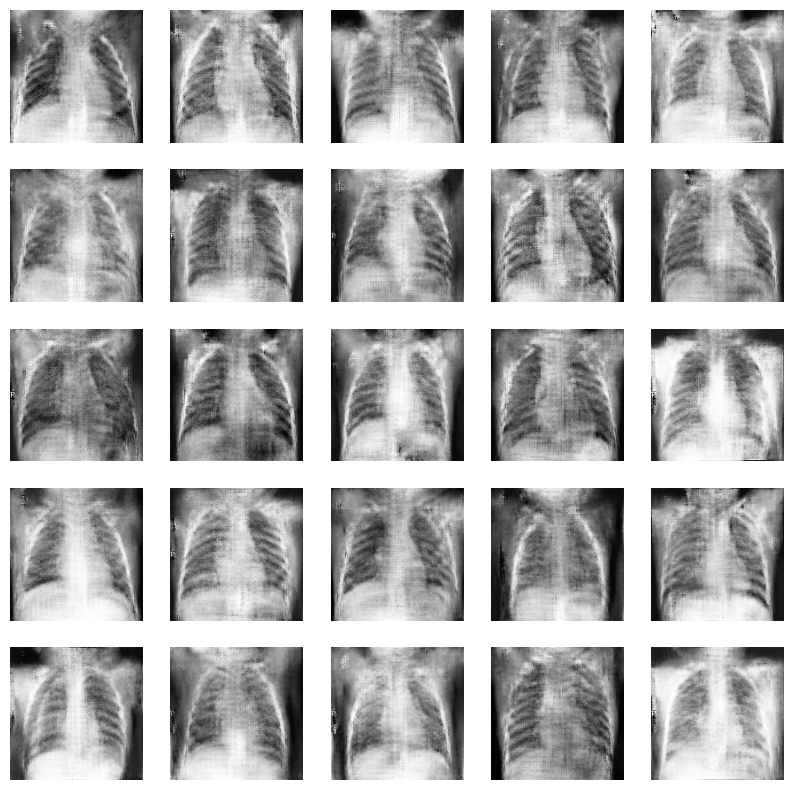

Epoch 191, Disc loss 0.2934728647582233, Generator loss 4.214225852489472
Epoch 192, Disc loss 0.3127028207294643, Generator loss 4.198366749286651
Epoch 193, Disc loss 0.3028498123399913, Generator loss 4.322223210334778
Epoch 194, Disc loss 0.24212511009536683, Generator loss 4.2847101330757145
Epoch 195, Disc loss 0.24705469594337046, Generator loss 4.062435662746429
Epoch 196, Disc loss 0.23917846204712986, Generator loss 4.12125256061554
Epoch 197, Disc loss 0.25024072341620923, Generator loss 4.1058853507041935
Epoch 198, Disc loss 0.25223721014335754, Generator loss 4.017955422401428
Epoch 199, Disc loss 0.29191661803051827, Generator loss 4.034412908554077
Epoch 200, Disc loss 0.2782968423329294, Generator loss 4.018255245685578
1/1 [==============================] - 0s 27ms/step


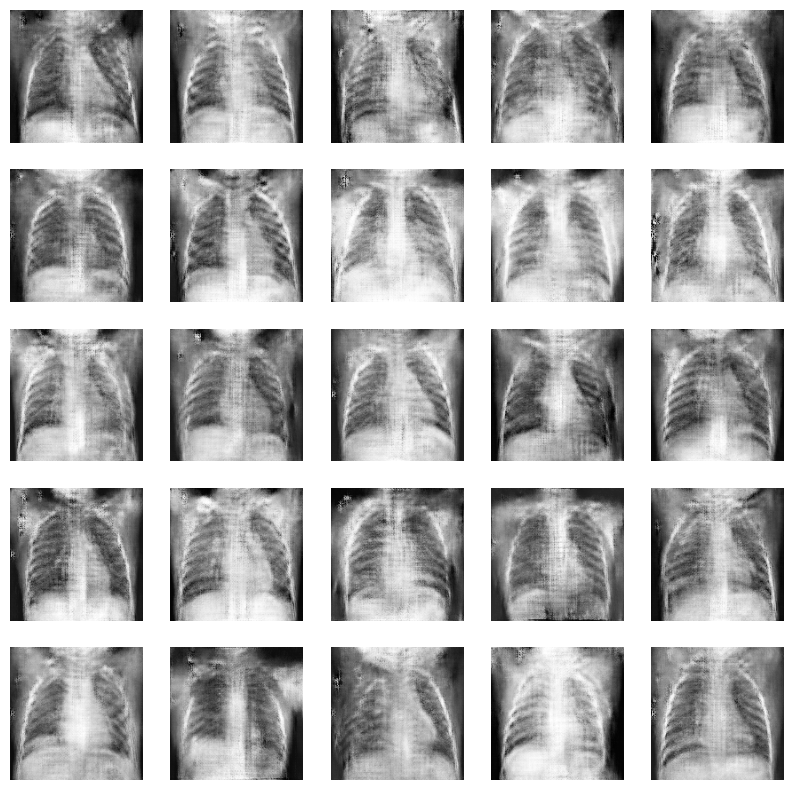

In [ ]:
# Training Loop

d_losses = []
g_losses = []

for epoch in range(total_epochs):
  epoch_d_loss = 0.0
  epoch_g_loss = 0.0

  # mini batch gd

  for step in range(no_of_batches):

    # Train descriminator
    descriminator.trainable = True
    idx = np.random.randint(0,1341,half_batch)
    real_imgs = x_train_normal[idx]

    noise = np.random.normal(0,1,size=(half_batch,noise_dim))
    fake_imgs = generator.predict(noise, verbose=0)

    real_y = np.ones((half_batch,1))*0.9
    fake_y = np.zeros((half_batch,1))

    d_loss_real = descriminator.train_on_batch(real_imgs, real_y)
    d_loss_fake = descriminator.train_on_batch(fake_imgs, fake_y)

    d_loss = 0.5*d_loss_real + 0.5*d_loss_fake
    epoch_d_loss += d_loss

    # Train generator

    descriminator.trainable = False
    noise = np.random.normal(0,1,size=(batch_size,noise_dim))
    ground_truth_y = np.ones((batch_size,1))
    g_loss = model.train_on_batch(noise,ground_truth_y,)
    epoch_g_loss += g_loss

  print(f"Epoch {epoch+1}, Disc loss {epoch_d_loss/no_of_batches}, Generator loss {epoch_g_loss/no_of_batches}")

  d_losses.append(epoch_d_loss/no_of_batches)
  g_losses.append(epoch_g_loss/no_of_batches)

  if (epoch+1)%10 == 0:
    generator.save("generator.h5")
    display_images()

### Comparing Real and Generated Images: Impact of Kernel Size and Learning Rate on Model Performance

Retraining the generator model with different kernel sizes (3x3, 4x4, 5x5) and learning rates (0.0002) to assess their impact on the quality of generated images. For each iteration, new synthetic images are being generated from random noise vectors and are being compared with real images from the training dataset. This exploration helps in understanding how parameter changes influence the generator's ability to produce realistic outputs.

#### Real Image

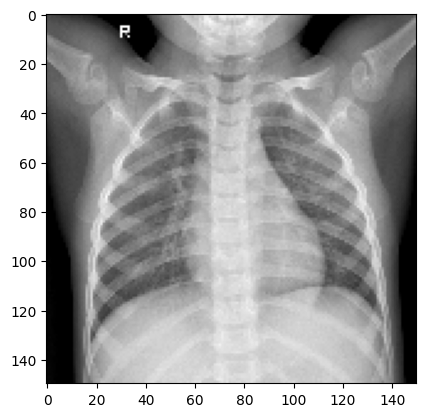

In [ ]:
plt.imshow(train[5000][0], 'gray')

#### Generated Images

In [ ]:
noise = np.random.normal(0,1,size = (1,noise_dim))
generated_img = generator.predict(noise)

1/1 [==============================] - 0s 27ms/step


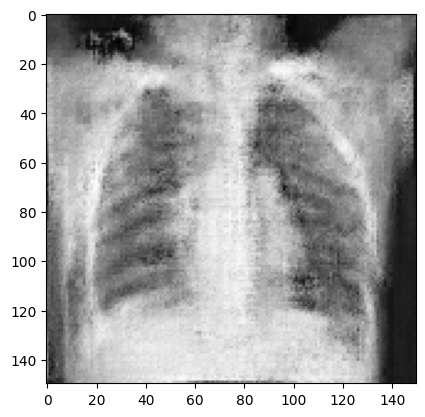

In [ ]:
plt.imshow(generated_img.reshape(150,150),'gray')  # kernel size 3x3

1/1 [==============================] - 0s 218ms/step


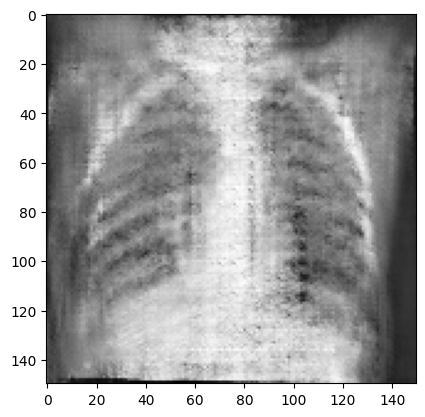

In [ ]:
noise = np.random.normal(0,1,size = (1,noise_dim))
generated_img = generator.predict(noise)
plt.imshow(generated_img.reshape(150,150),'gray')  # kernel size 4x4

1/1 [==============================] - 0s 94ms/step


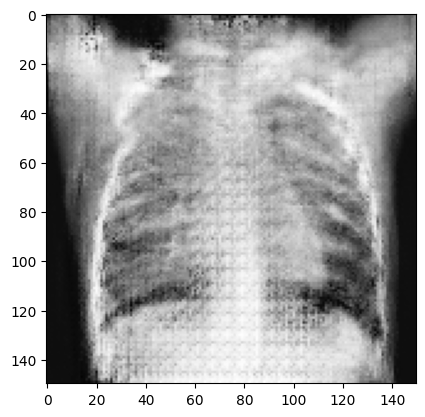

In [ ]:
noise = np.random.normal(0,1,size = (1,noise_dim))
generated_img = generator.predict(noise)
plt.imshow(generated_img.reshape(150,150),'gray')  # kernel size 5x5

1/1 [==============================] - 0s 31ms/step


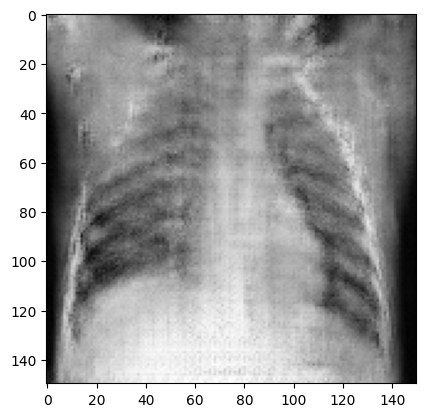

In [ ]:
noise = np.random.normal(0,1,size = (1,noise_dim))
generated_img = generator.predict(noise)
plt.imshow(generated_img.reshape(150,150),'gray')  # kernel size 5x5 new 16-08-23

1/1 [==============================] - 0s 20ms/step


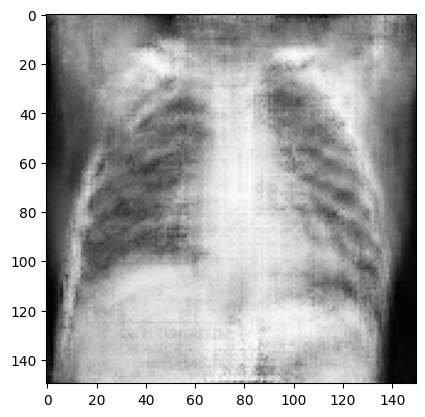

In [ ]:
noise = np.random.normal(0,1,size = (1,noise_dim))
generated_img = generator.predict(noise)
plt.imshow(generated_img.reshape(150,150),'gray')  # kernel size 5x5 new 29-09-23 c

1/1 [==============================] - 0s 24ms/step


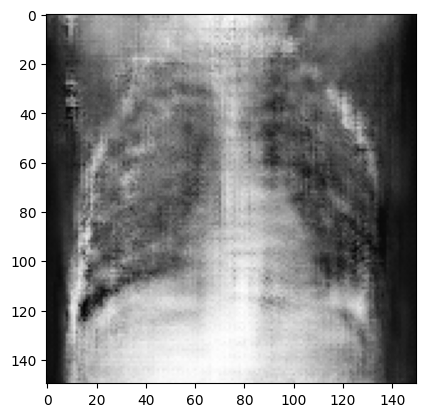

In [ ]:
noise = np.random.normal(0,1,size = (1,noise_dim))
generated_img = generator.predict(noise)
plt.imshow(generated_img.reshape(150,150),'gray')  # kernel size 5x5 new 29-09-23 (this (with all above) with lr=0.0002)

### Saving and Loading the GAN Model Components

In this code, the `save` function is used to save the GAN (Generative Adversarial Network), generator, and discriminator models. The discriminator's trainability is temporarily set to `False` while saving the GAN to ensure that only the GAN's weights are saved. Afterward, the discriminator's trainability is restored, and all three models are saved individually. The `load` function loads the saved models and displays their summaries for inspection. This approach allows for efficient saving and loading of model components for future use or experimentation.

This code was adapted from [Keras Issue #10806](https://github.com/keras-team/keras/issues/10806#issuecomment-524565808).

In [ ]:
def save(gan, generator, descriminator):
    descriminator.trainable = False
    save_model(gan, 'gan')
    descriminator.trainable = True
    save_model(generator, 'generator')
    save_model(descriminator, 'descriminator')


def load():
    descriminator = load_model('descriminator')
    generator = load_model('generator')
    gan = load_model('gan')
    gan.summary()
    descriminator.summary()
    generator.summary()

    return gan, generator, descriminator

In [ ]:
save(model, generator, descriminator)

In [ ]:
model, generator, descriminator = load()

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 100)]             0         
                                                                 
 sequential_20 (Sequential)  (None, 150, 150, 1)       8287233   
                                                                 
 sequential_21 (Sequential)  (None, 1)                 8206793   
                                                                 
Total params: 16494026 (62.92 MB)
Trainable params: 8286849 (31.61 MB)
Non-trainable params: 8207177 (31.31 MB)
_________________________________________________________________
Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 50, 50, 64)        1664      
                                                       